<a href="https://colab.research.google.com/github/yeesem/Advanced-Tensorflow-Specialization/blob/main/Eager_Few_Shot_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4106, done.
remote: Counting objects: 100% (4106/4106), done.
remote: Compressing objects: 100% (3106/3106), done.
remote: Total 4106 (delta 1187), reused 2032 (delta 938), pack-reused 0
Receiving objects: 100% (4106/4106), 45.22 MiB | 36.87 MiB/s, done.
Resolving deltas: 100% (1187/1187), done.


In [2]:
# For compatibility. Pin tf-models-official version so it will use Tensorflow 2.15.
!sed -i 's/tf-models-official>=2.5.1/tf-models-official==2.15.0/g' ./models/research/object_detection/packages/tf2/setup.py

In [3]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 41.9 MB/s eta 0:00:00
     ━━━━━━━━

In [4]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

# Utilities

In [5]:
def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path,'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width,im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height,im_width,3)
  ).astype(np.uint8)

def plot_detection(
    image_np,
    boxes,
    classes,
    scores,
    category_index,
    figsize = (12,16),
    image_name = None
):
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates = True,
      min_score_thresh = 0.8
  )
  if image_name:
    plt.imsave(image_name,image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

# Rubber Ducky Data

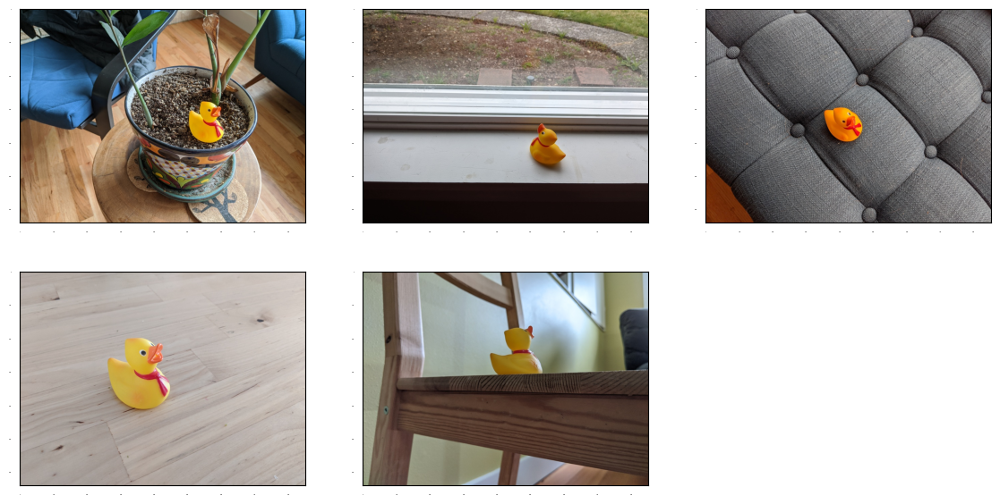

In [6]:
# Load images and visualize
train_image_dir = 'models/research/object_detection/test_images/ducky/train/'
train_images_np = []

for i in range(1,6):
  image_path = os.path.join(train_image_dir,'robertducky' + str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14,7]

for idx, train_image_np in enumerate(train_images_np):
  plt.subplot(2,3,idx + 1)
  plt.imshow(train_image_np)
plt.show()

# Annotate Images with Bounding Boxes

In [7]:
gt_boxes = []
colab_utils.annotate(train_images_np,box_storage_pointer = gt_boxes)

<IPython.core.display.Javascript object>

In [8]:
# If do not label the data
gt_boxes = [
            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
]

# Prepare data for training

In [9]:
duck_class_id = 1
num_classes = 1

category_index = {
    duck_class_id :{
        'id':duck_class_id,
        'name':'rubber_ducky'
    }
}

# Convert class labels to one-hot; convert everything to tensors.
label_id_offset = 1
train_image_tensor = []
gt_classes_one_hot_tensors = []
gt_boxes_tensor = []
for (train_image_np,gt_box_np) in zip(
    train_images_np,gt_boxes
):
  train_image_tensor.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np,dtype = tf.float32
  ),axis = 0))
  gt_boxes_tensor.append(tf.convert_to_tensor(gt_box_np,dtype = tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')

Done prepping data.


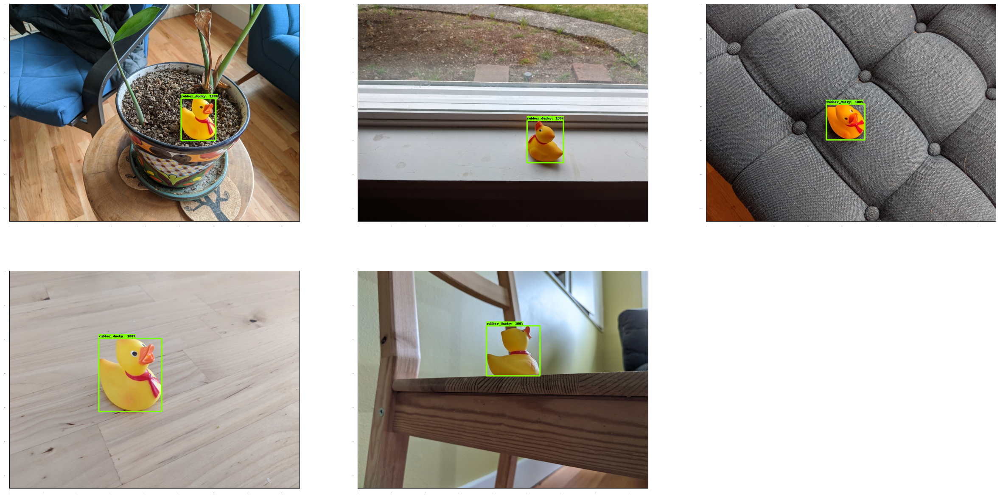

In [10]:
# give boxes a score of 100%
dummy_score = np.array([1.0],dtype = np.float32)

plt.figure(figsize = (30,15))
for idx in range(5):
  plt.subplot(2,3,idx + 1)
  plot_detection(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_score,
      category_index
  )
plt.show()

# Create Model and Restore Weights for all but last layer

In [11]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2024-06-10 03:25:04--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.117.207, 142.250.99.207, 142.250.107.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.117.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   139MB/s    in 1.7s    

2024-06-10 03:25:06 (139 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [12]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads = detection_model._box_predictor._base_tower_layers_for_heads,
    #_prediction_heads = detection_model._box_preditor._prediction_heads,
    _box_prediction_heads = detection_model._box_predictor._box_prediction_head,
)
fake_model = tf.compat.v2.train.Checkpoint(
    _feature_extractor = detection_model._feature_extractor,
    _box_predictor = fake_box_predictor
)
ckpt = tf.compat.v2.train.Checkpoint(model = fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variable are created
image,shapes = detection_model.preprocess(tf.zeros([1,640,640,3]))
prediction_dict = detection_model.predict(image,shapes)
_ = detection_model.postprocess(prediction_dict,shapes)
print("Weights restored")

Building model and restoring weights for fine-tuning...
Weights restored


# Eager mode custom training loop

In [13]:
tf.keras.backend.set_learning_phase(True)

batch_size = 4
learning_rate = 0.01
num_batches = 100

# Select variables in top layers to fine-tune
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forword + backward pass for a single train step
def get_model_train_step_function(model,optimizer,vars_to_fine_tune):
  @tf.function
  def train_step_fn(image_tensors,
                    ground_boxes_list,
                    groundtruth_classes_list):
    shapes = tf.constant(batch_size * [[640,640,3]],dtype = tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list = ground_boxes_list,
        groundtruth_classes_list = groundtruth_classes_list
    )
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors],axis = 0
      )
      prediction_dict = model.predict(preprocessed_images,shapes)
      losses_dict = model.loss(prediction_dict,shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate,momentum = 0.9)
train_step_fn = get_model_train_step_function(
    detection_model,optimizer,to_fine_tune)

print("Start Fine Tuning",flush = True)
for idx in range(num_batches):
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  gt_boxes_list = [gt_boxes_tensor[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensor[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

Start Fine Tuning


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


batch 0 of 100, loss=1.7289585
batch 10 of 100, loss=0.35021013
batch 20 of 100, loss=0.10329373
batch 30 of 100, loss=0.045112744
batch 40 of 100, loss=0.0149484705
batch 50 of 100, loss=0.0076596374
batch 60 of 100, loss=0.004671083
batch 70 of 100, loss=0.0033297767
batch 80 of 100, loss=0.0019238946
batch 90 of 100, loss=0.002137609
Done fine-tuning!


# Load test images and run inference with new model

In [16]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

@tf.function
def detect(input_tensor):
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i],dtype = tf.float32)
  detections = detect(input_tensor)

  plot_detection(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index,figsize = (15,20),image_name = 'gif_frame_' + ('%02d' % i) + ".jpg"
  )

<ipython-input-20-151fceb5e596>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


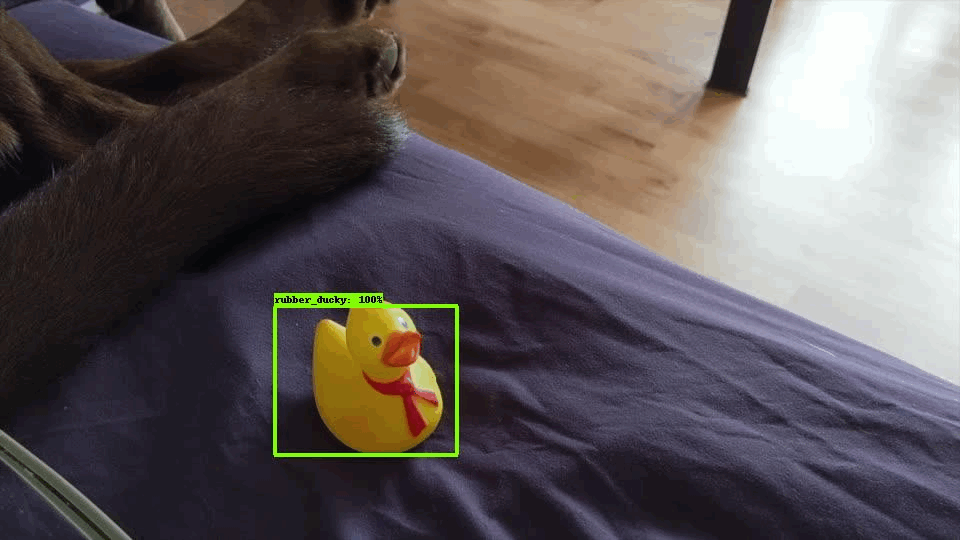

In [20]:
imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps = 5)

display(IPyImage(open(anim_file,'rb').read()))